# DINOv2 Benchmark: Reference Image With vs Without Background

**Goal:** Evaluate if removing background from reference image improves object detection.

**Setup:**
- Reference WITH background: `ref_car_BG.png`
- Reference WITHOUT background: `ref_car_NBG.jpg`
- Test images: UrbanSyn RGB images
- Ground truth: UrbanSyn panoptic segmentation masks

**Metrics:** IoU, Precision, Recall, F1-Score

In [1]:
!nvidia-smi

Fri Jan 30 09:42:58 2026       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 580.126.09             Driver Version: 580.126.09     CUDA Version: 13.0     |
+-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA GeForce RTX 3070 ...    Off |   00000000:01:00.0 Off |                  N/A |
| N/A   48C    P8              9W /   80W |      15MiB /   8192MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [3]:
# Debug CUDA - run this FIRST before any other imports
import torch
print(f"CUDA available: {torch.cuda.is_available()}")
print(f"CUDA device count: {torch.cuda.device_count()}")
if torch.cuda.is_available():
    print(f"CUDA device: {torch.cuda.get_device_name(0)}")
else:
    print("Checking why CUDA is not available...")
    try:
        torch.zeros(1).cuda()
    except Exception as e:
        print(f"CUDA error: {e}")


CUDA available: True
CUDA device count: 1
CUDA device: NVIDIA GeForce RTX 3070 Ti Laptop GPU


In [3]:
# Imports
import numpy as np  # Import numpy first to avoid torch conflicts
import torch
from PIL import Image
import torch.nn.functional as F
import matplotlib.pyplot as plt
import os
from glob import glob

print(f"Numpy version: {np.__version__}")
print(f"Torch version: {torch.__version__}")

_target_device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Using device: {_target_device}")

Numpy version: 1.26.4
Torch version: 2.5.1+cu121
Using device: cpu


In [4]:
# Load DINOv2
print("Loading DINOv2...")
model = torch.hub.load('facebookresearch/dinov2', 'dinov2_vits14_reg').eval().to(_target_device)

# Custom transform (avoids numpy compatibility issues)
def pil_to_tensor(img):
    """Convert PIL Image to tensor."""
    img = img.convert('RGB')
    img = img.resize((518, 518), Image.BILINEAR)
    img_data = list(img.getdata())
    width, height = img.size
    
    r = torch.tensor([p[0] for p in img_data], dtype=torch.float32).view(height, width) / 255.0
    g = torch.tensor([p[1] for p in img_data], dtype=torch.float32).view(height, width) / 255.0
    b = torch.tensor([p[2] for p in img_data], dtype=torch.float32).view(height, width) / 255.0
    
    img_tensor = torch.stack([r, g, b], dim=0)
    mean = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1)
    std = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1)
    return (img_tensor - mean) / std

print("Model loaded!")

Loading DINOv2...


Using cache found in /app/models/hub/facebookresearch_dinov2_main
/app/models/hub/facebookresearch_dinov2_main/dinov2/layers/swiglu_ffn.py:51: UserWarning: xFormers is not available (SwiGLU)
  warnings.warn("xFormers is not available (SwiGLU)")
/app/models/hub/facebookresearch_dinov2_main/dinov2/layers/attention.py:33: UserWarning: xFormers is not available (Attention)
  warnings.warn("xFormers is not available (Attention)")
/app/models/hub/facebookresearch_dinov2_main/dinov2/layers/block.py:40: UserWarning: xFormers is not available (Block)
  warnings.warn("xFormers is not available (Block)")


Model loaded!


In [5]:
# Helper functions
def extract_global_feature(model, image_tensor, device):
    """Extract global feature vector from image."""
    image_tensor = image_tensor.to(device)
    with torch.no_grad():
        return model(image_tensor)

def extract_patch_features(model, image_tensor, device):
    """Extract patch features from image."""
    image_tensor = image_tensor.to(device)
    with torch.no_grad():
        features = model.forward_features(image_tensor)
        return features['x_norm_patchtokens']

def compute_similarity_map(global_feature, patch_features):
    """Compute cosine similarity between global feature and each patch."""
    global_norm = F.normalize(global_feature, p=2, dim=1)
    patch_norm = F.normalize(patch_features, p=2, dim=2)
    similarity = torch.matmul(patch_norm, global_norm.T).squeeze()
    return similarity.reshape(37, 37).cpu().numpy()

def upscale_mask(mask, target_size):
    """Upscale 37x37 mask to target size."""
    mask_tensor = torch.from_numpy(mask).unsqueeze(0).unsqueeze(0).float()
    upscaled = F.interpolate(mask_tensor, size=target_size, mode='bilinear', align_corners=False)
    return upscaled.squeeze().numpy()

def compute_metrics(pred_mask, gt_mask):
    """Compute IoU, Precision, Recall, F1."""
    pred_binary = (pred_mask > 0.5).astype(np.float32)
    gt_binary = (gt_mask > 0.5).astype(np.float32)
    
    intersection = np.logical_and(pred_binary, gt_binary).sum()
    union = np.logical_or(pred_binary, gt_binary).sum()
    
    tp = intersection
    fp = np.logical_and(pred_binary, ~gt_binary.astype(bool)).sum()
    fn = np.logical_and(~pred_binary.astype(bool), gt_binary.astype(bool)).sum()
    
    iou = intersection / union if union > 0 else 0.0
    precision = tp / (tp + fp) if (tp + fp) > 0 else 0.0
    recall = tp / (tp + fn) if (tp + fn) > 0 else 0.0
    f1 = 2 * precision * recall / (precision + recall) if (precision + recall) > 0 else 0.0
    
    return {'iou': iou, 'precision': precision, 'recall': recall, 'f1': f1}

print("Helper functions loaded!")

Helper functions loaded!


Reference WITH BG: (1000, 770)
Reference WITHOUT BG: (393, 439)


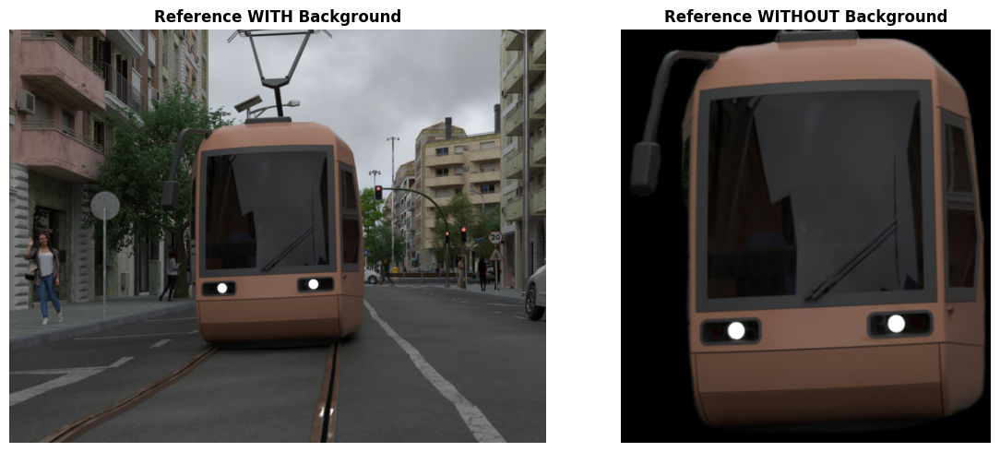

In [5]:
# Load reference images
REF_DIR = 'ref_car'

ref_bg_path = os.path.join(REF_DIR, 'ref_car_BG.png')
ref_nbg_path = os.path.join(REF_DIR, 'ref_car_NBG.jpg')

ref_bg_img = Image.open(ref_bg_path).convert('RGB')
ref_nbg_img = Image.open(ref_nbg_path).convert('RGB')

print(f"Reference WITH BG: {ref_bg_img.size}")
print(f"Reference WITHOUT BG: {ref_nbg_img.size}")

# Display references
fig, axes = plt.subplots(1, 2, figsize=(12, 5))
axes[0].imshow(ref_bg_img)
axes[0].set_title('Reference WITH Background', fontweight='bold')
axes[0].axis('off')
axes[1].imshow(ref_nbg_img)
axes[1].set_title('Reference WITHOUT Background', fontweight='bold')
axes[1].axis('off')
plt.tight_layout()
plt.show()

In [6]:
# Extract reference features
print("Extracting reference features...")

ref_bg_tensor = pil_to_tensor(ref_bg_img).unsqueeze(0).to(_target_device)
ref_nbg_tensor = pil_to_tensor(ref_nbg_img).unsqueeze(0).to(_target_device)

ref_bg_feature = extract_global_feature(model, ref_bg_tensor, _target_device)
ref_nbg_feature = extract_global_feature(model, ref_nbg_tensor, _target_device)

print(f"Reference WITH BG feature: {ref_bg_feature.shape}")
print(f"Reference WITHOUT BG feature: {ref_nbg_feature.shape}")

Extracting reference features...
Reference WITH BG feature: torch.Size([1, 384])
Reference WITHOUT BG feature: torch.Size([1, 384])


In [7]:
# Load panoptic mask and extract car instances
def load_car_mask_from_panoptic(panoptic_path):
    """
    Load panoptic mask and extract ONLY car pixels with color #d2c310.
    #d2c310 = RGB(210, 195, 16)
    """
    panoptic = np.array(Image.open(panoptic_path))
    
    CAR_COLOR = (210, 195, 16)  # #d2c310
    
    if len(panoptic.shape) == 3:
        r_match = (panoptic[:,:,0] == CAR_COLOR[0])
        g_match = (panoptic[:,:,1] == CAR_COLOR[1])
        b_match = (panoptic[:,:,2] == CAR_COLOR[2])
        car_mask = (r_match & g_match & b_match).astype(np.float32)
    else:
        car_mask = np.zeros_like(panoptic, dtype=np.float32)
    
    return car_mask

# Test with one image
test_panoptic = 'panoptic/panoptic_0001.png'
if os.path.exists(test_panoptic):
    test_mask = load_car_mask_from_panoptic(test_panoptic)
    print(f"Function loaded! Test mask: {test_mask.sum():.0f} car pixels")
else:
    print("Function loaded!")

Function loaded! Test mask: 0 car pixels


In [8]:
# Setup paths
RGB_DIR = 'urbansyn_subset/rgb'
PANOPTIC_DIR = 'panoptic'

# Get matching RGB and panoptic files
rgb_files = sorted(glob(os.path.join(RGB_DIR, 'rgb_*.png')))
print(f"Found {len(rgb_files)} RGB images")

# Create pairs of (rgb_path, panoptic_path)
image_pairs = []
for rgb_path in rgb_files:
    # Extract number from filename: rgb_0001.png -> 0001
    basename = os.path.basename(rgb_path)
    num = basename.replace('rgb_', '').replace('.png', '')
    panoptic_path = os.path.join(PANOPTIC_DIR, f'panoptic_{num}.png')
    
    if os.path.exists(panoptic_path):
        image_pairs.append((rgb_path, panoptic_path))

print(f"Found {len(image_pairs)} matching RGB-panoptic pairs")

Found 162 RGB images
Found 162 matching RGB-panoptic pairs


In [9]:
# Run benchmark
THRESHOLD = 0.2
N_SAMPLES = min(50, len(image_pairs))  # Limit for speed

results = []

for i, (rgb_path, panoptic_path) in enumerate(image_pairs[:N_SAMPLES]):
    # Load images
    rgb_img = Image.open(rgb_path).convert('RGB')
    gt_mask = load_car_mask_from_panoptic(panoptic_path)
    
    # Skip if no cars in ground truth
    if gt_mask.sum() < 100:
        continue
    
    # Extract patch features from test image
    rgb_tensor = pil_to_tensor(rgb_img).unsqueeze(0).to(_target_device)
    patch_features = extract_patch_features(model, rgb_tensor, _target_device)
    
    # Compute similarity maps
    sim_map_bg = compute_similarity_map(ref_bg_feature, patch_features)
    sim_map_nbg = compute_similarity_map(ref_nbg_feature, patch_features)
    
    # Create predicted masks
    pred_mask_bg = (sim_map_bg >= THRESHOLD).astype(np.float32)
    pred_mask_nbg = (sim_map_nbg >= THRESHOLD).astype(np.float32)
    
    # Upscale to ground truth size
    pred_mask_bg_up = upscale_mask(pred_mask_bg, gt_mask.shape)
    pred_mask_nbg_up = upscale_mask(pred_mask_nbg, gt_mask.shape)
    
    # Compute metrics
    metrics_bg = compute_metrics(pred_mask_bg_up, gt_mask)
    metrics_nbg = compute_metrics(pred_mask_nbg_up, gt_mask)
    
    results.append({
        'rgb_path': rgb_path,
        'rgb_img': rgb_img,
        'gt_mask': gt_mask,
        'sim_map_bg': sim_map_bg,
        'sim_map_nbg': sim_map_nbg,
        'pred_mask_bg': pred_mask_bg_up,
        'pred_mask_nbg': pred_mask_nbg_up,
        'metrics_bg': metrics_bg,
        'metrics_nbg': metrics_nbg,
    })
    
    print(f"[{i+1}/{N_SAMPLES}] {os.path.basename(rgb_path)}: "
          f"BG IoU={metrics_bg['iou']:.3f}, NBG IoU={metrics_nbg['iou']:.3f}")

print(f"\nProcessed {len(results)} images with cars")

[3/50] rgb_0003.png: BG IoU=0.393, NBG IoU=0.814
[5/50] rgb_0005.png: BG IoU=0.072, NBG IoU=0.182
[14/50] rgb_0014.png: BG IoU=0.004, NBG IoU=0.000
[18/50] rgb_0018.png: BG IoU=0.112, NBG IoU=0.317
[27/50] rgb_0027.png: BG IoU=0.247, NBG IoU=0.458
[33/50] rgb_0033.png: BG IoU=0.182, NBG IoU=0.613
[35/50] rgb_0035.png: BG IoU=0.113, NBG IoU=0.326
[36/50] rgb_0036.png: BG IoU=0.164, NBG IoU=0.323
[37/50] rgb_0037.png: BG IoU=0.165, NBG IoU=0.427
[39/50] rgb_0039.png: BG IoU=0.112, NBG IoU=0.333
[41/50] rgb_0041.png: BG IoU=0.111, NBG IoU=0.461
[43/50] rgb_0043.png: BG IoU=0.167, NBG IoU=0.427
[45/50] rgb_0045.png: BG IoU=0.154, NBG IoU=0.270
[47/50] rgb_0047.png: BG IoU=0.066, NBG IoU=0.162
[48/50] rgb_0048.png: BG IoU=0.145, NBG IoU=0.412

Processed 15 images with cars


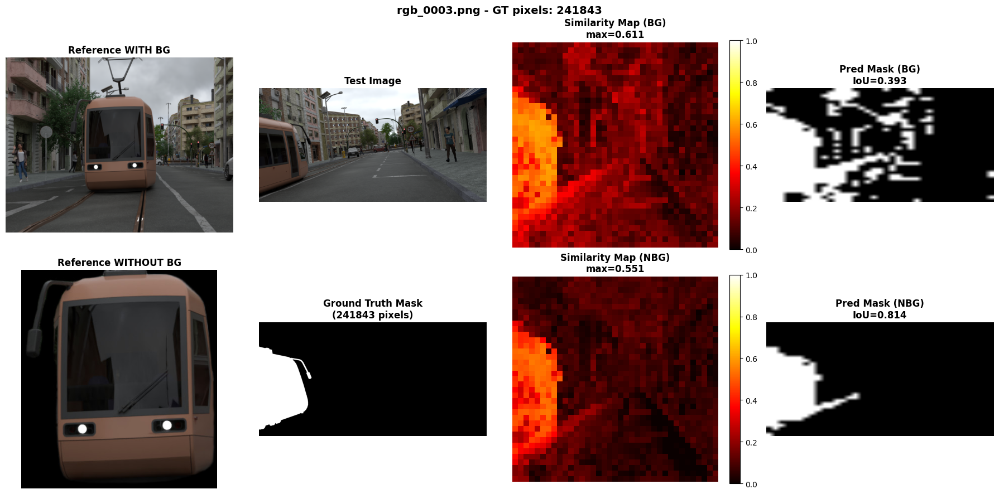

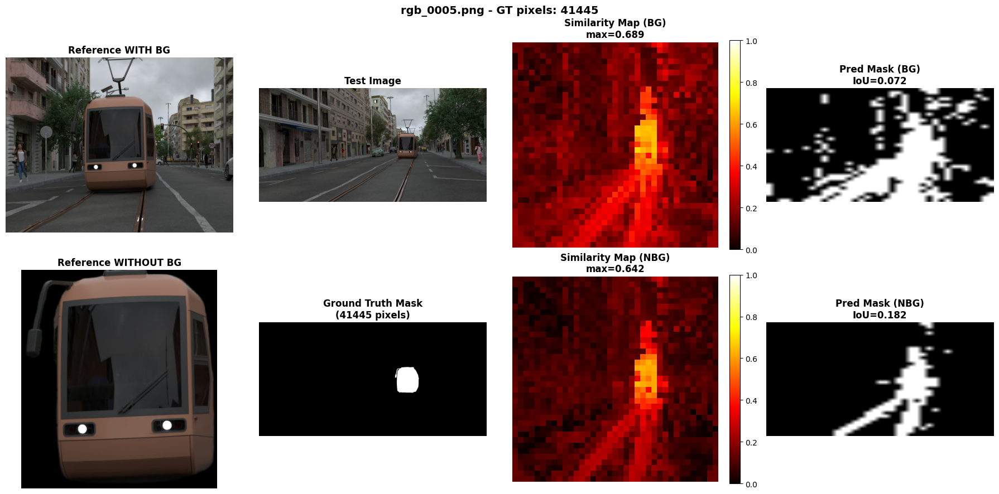

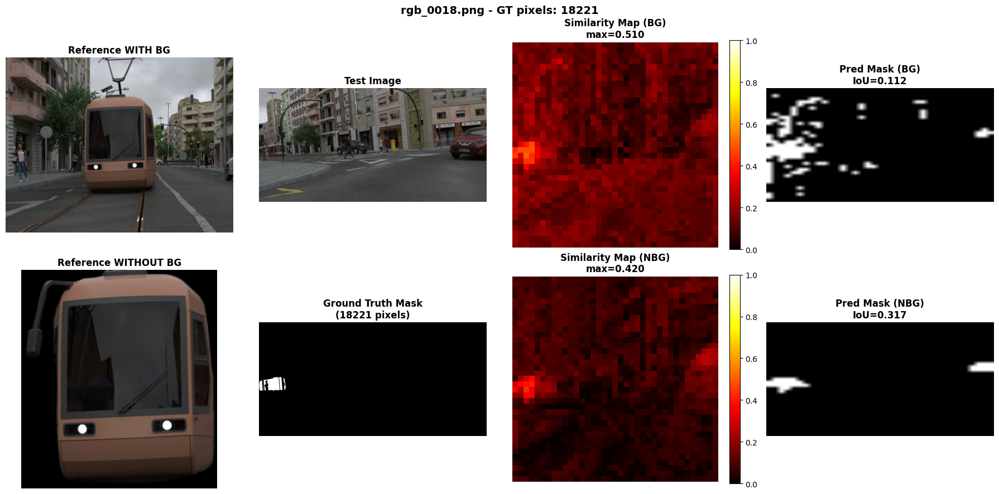

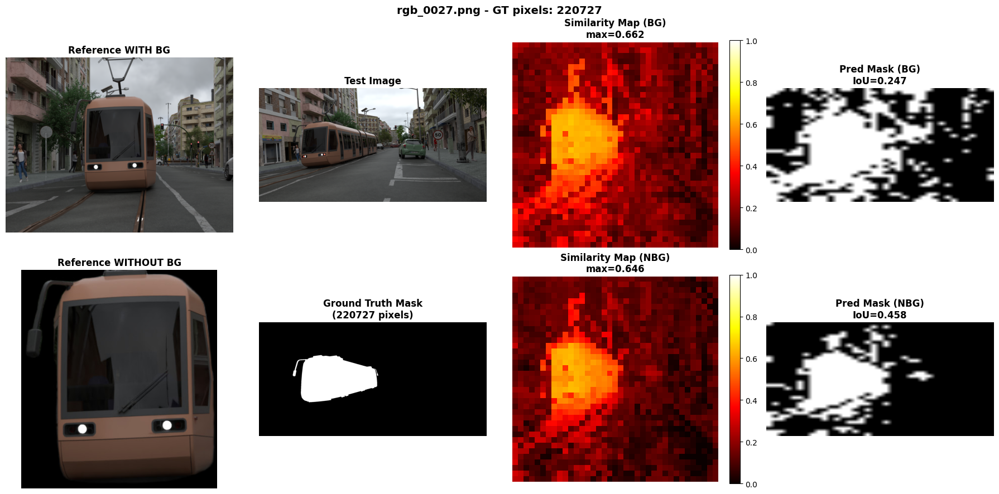

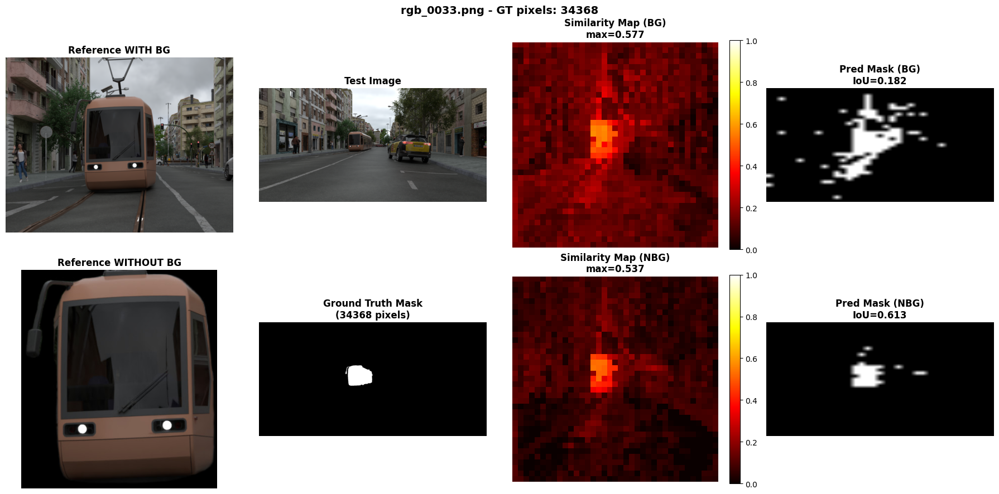

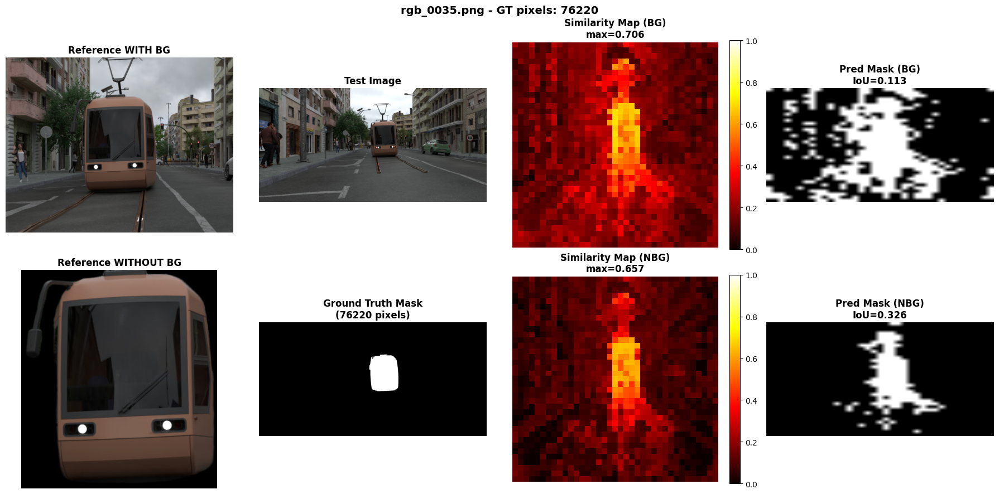

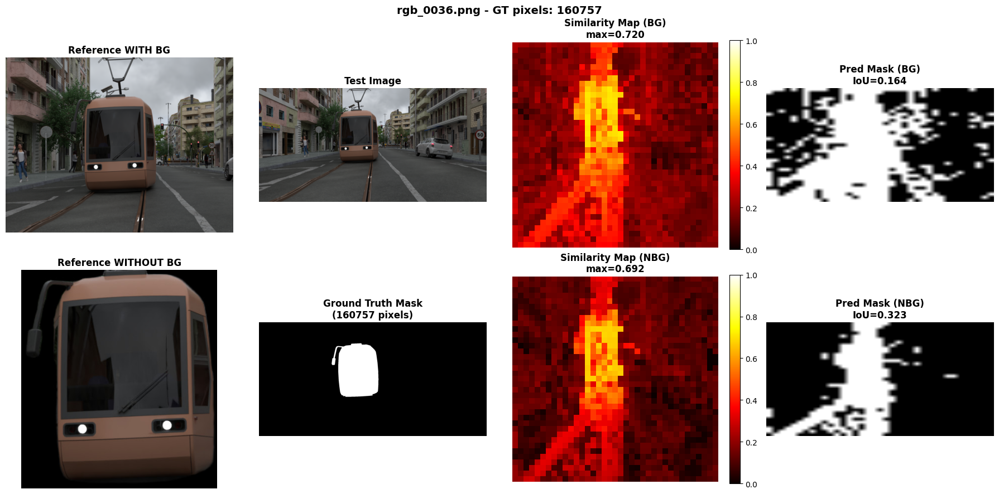

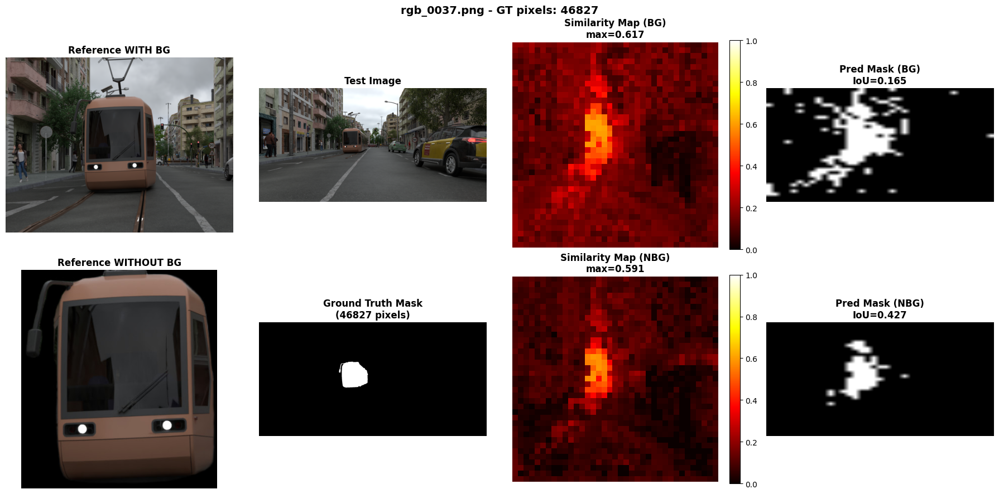

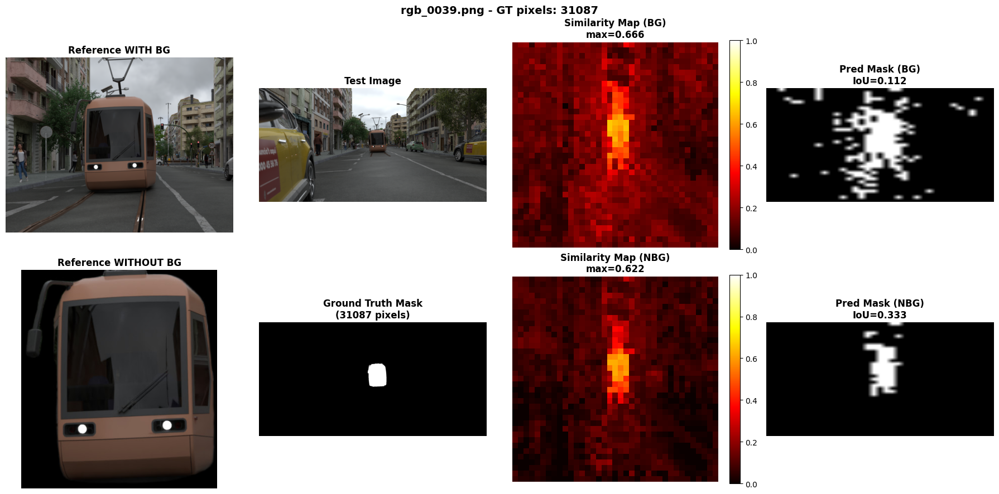

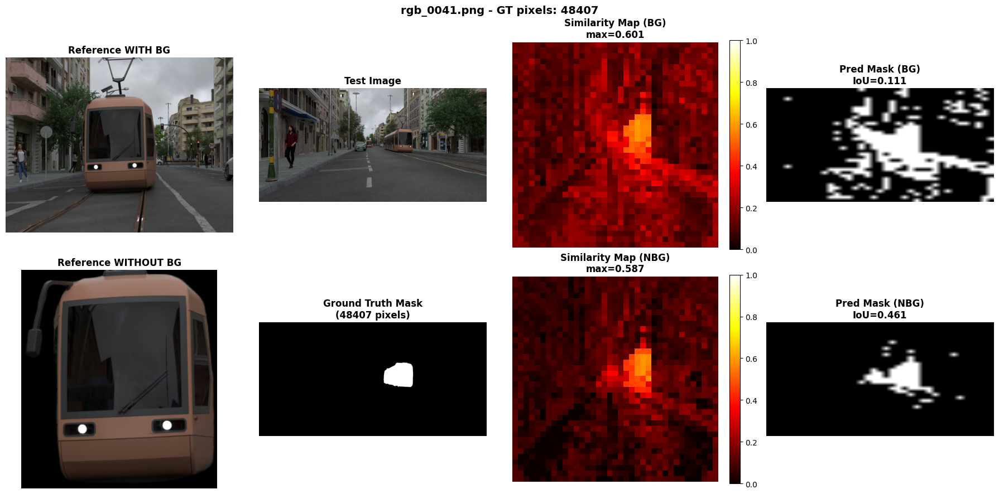


Showed 10 images with detected cars (>500 GT pixels)


In [10]:
# Visualize results - ONLY images where cars are detected in ground truth
n_show = min(10, len(results))
shown = 0

for r in results:
    # Only show if ground truth has car pixels
    if r['gt_mask'].sum() < 500:  # Skip images with very few car pixels
        continue
    
    if shown >= n_show:
        break
    
    fig, axes = plt.subplots(2, 4, figsize=(18, 9))
    
    # Row 1: WITH Background reference
    axes[0, 0].imshow(ref_bg_img)
    axes[0, 0].set_title('Reference WITH BG', fontweight='bold')
    axes[0, 0].axis('off')
    
    axes[0, 1].imshow(r['rgb_img'])
    axes[0, 1].set_title('Test Image', fontweight='bold')
    axes[0, 1].axis('off')
    
    im1 = axes[0, 2].imshow(r['sim_map_bg'], cmap='hot', vmin=0, vmax=1)
    axes[0, 2].set_title(f'Similarity Map (BG)\nmax={r["sim_map_bg"].max():.3f}', fontweight='bold')
    axes[0, 2].axis('off')
    plt.colorbar(im1, ax=axes[0, 2], fraction=0.046)
    
    axes[0, 3].imshow(r['pred_mask_bg'], cmap='gray')
    axes[0, 3].set_title(f'Pred Mask (BG)\nIoU={r["metrics_bg"]["iou"]:.3f}', fontweight='bold')
    axes[0, 3].axis('off')
    
    # Row 2: WITHOUT Background reference
    axes[1, 0].imshow(ref_nbg_img)
    axes[1, 0].set_title('Reference WITHOUT BG', fontweight='bold')
    axes[1, 0].axis('off')
    
    axes[1, 1].imshow(r['gt_mask'], cmap='gray')
    axes[1, 1].set_title(f'Ground Truth Mask\n({r["gt_mask"].sum():.0f} pixels)', fontweight='bold')
    axes[1, 1].axis('off')
    
    im2 = axes[1, 2].imshow(r['sim_map_nbg'], cmap='hot', vmin=0, vmax=1)
    axes[1, 2].set_title(f'Similarity Map (NBG)\nmax={r["sim_map_nbg"].max():.3f}', fontweight='bold')
    axes[1, 2].axis('off')
    plt.colorbar(im2, ax=axes[1, 2], fraction=0.046)
    
    axes[1, 3].imshow(r['pred_mask_nbg'], cmap='gray')
    axes[1, 3].set_title(f'Pred Mask (NBG)\nIoU={r["metrics_nbg"]["iou"]:.3f}', fontweight='bold')
    axes[1, 3].axis('off')
    
    plt.suptitle(f'{os.path.basename(r["rgb_path"])} - GT pixels: {r["gt_mask"].sum():.0f}', fontsize=14, fontweight='bold')
    plt.tight_layout()
    plt.show()
    
    shown += 1

print(f"\nShowed {shown} images with detected cars (>500 GT pixels)")


rgb_0003.png
Reference WITH Background:


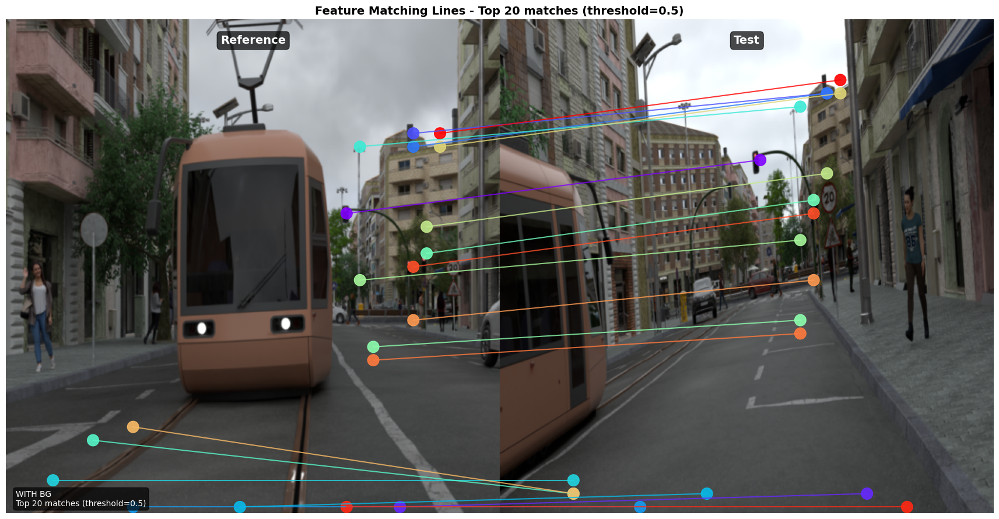


Reference WITHOUT Background:


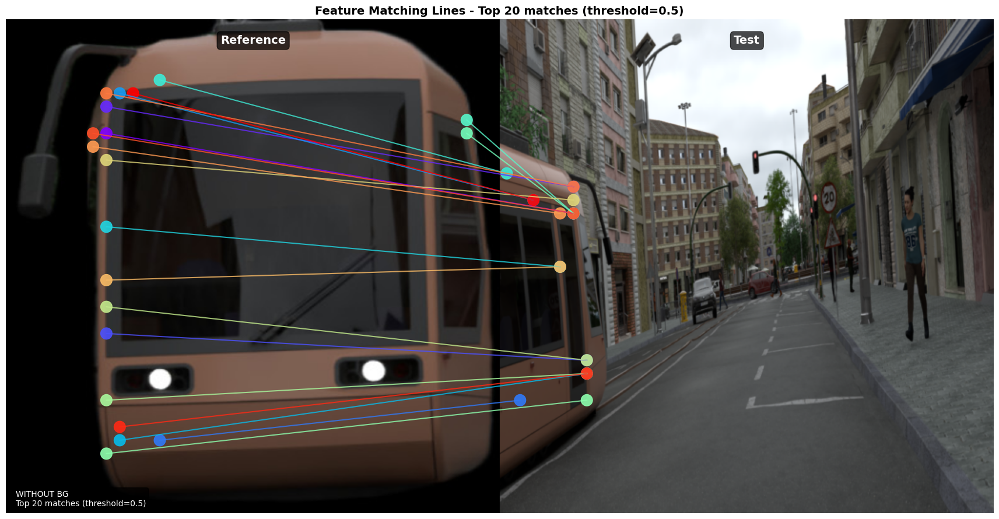


rgb_0005.png
Reference WITH Background:


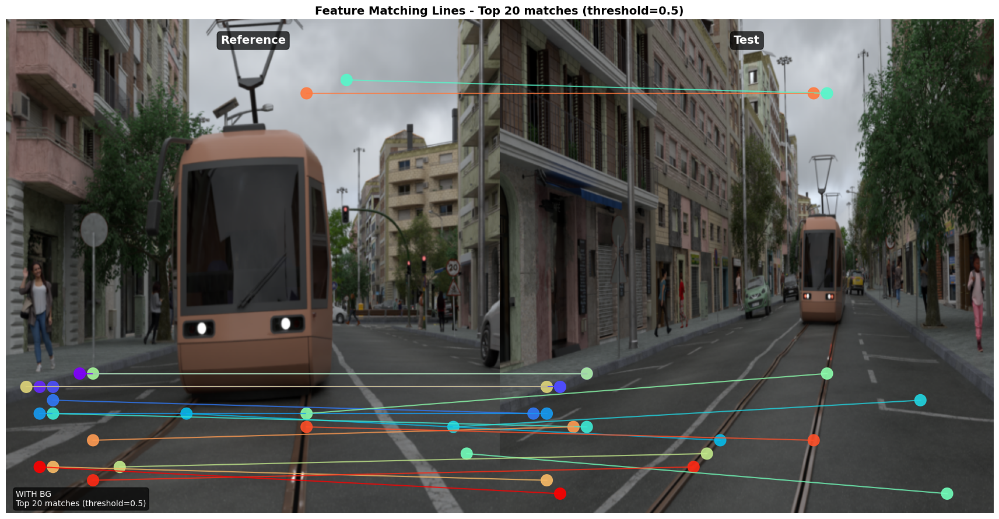


Reference WITHOUT Background:


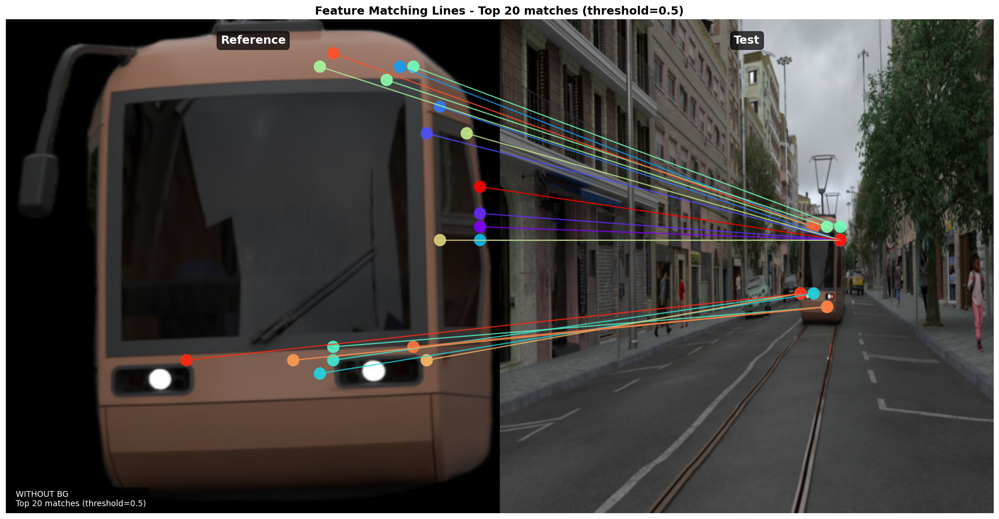


rgb_0018.png
Reference WITH Background:


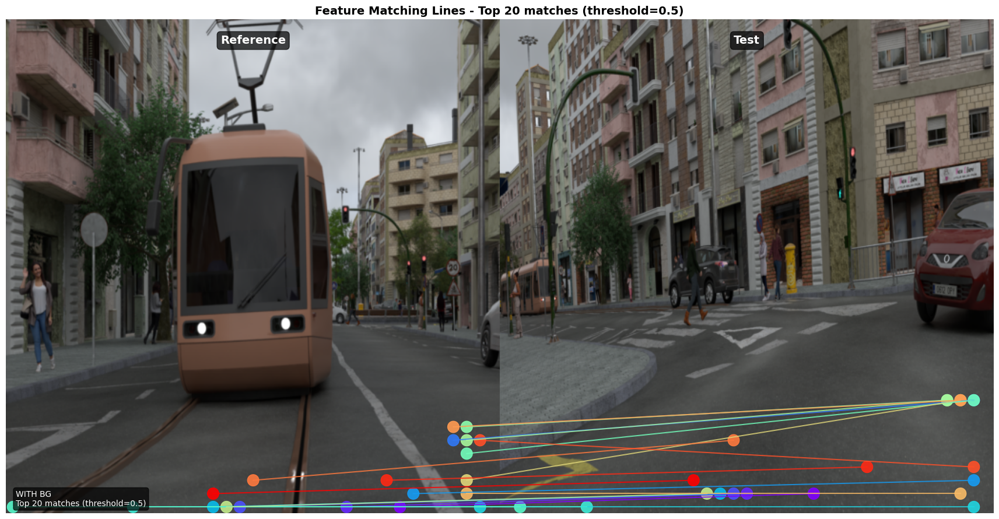


Reference WITHOUT Background:


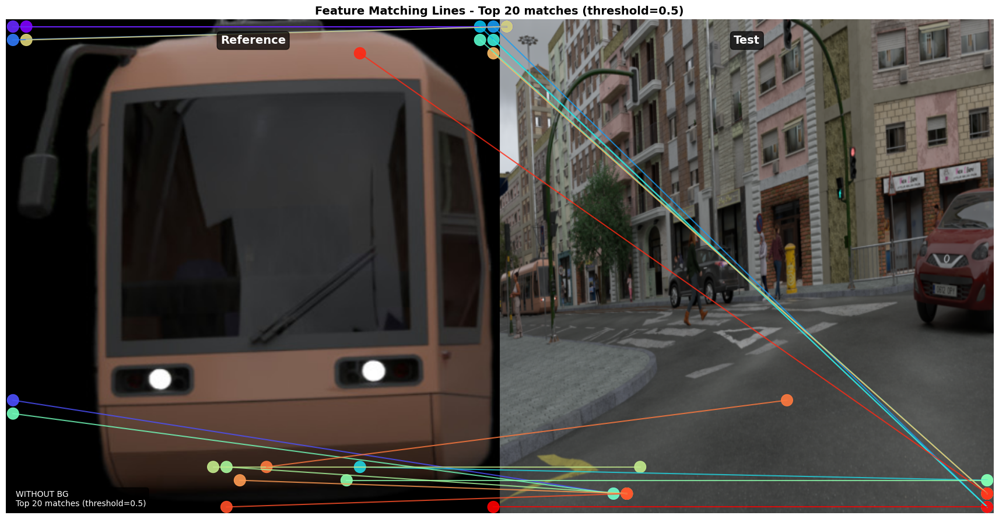


Showed patch matching for 3 images


In [11]:
# Visualize patch-to-patch feature matching lines
def visualize_patch_matching(model, ref_img, test_img, ref_name, top_k=20, threshold=0.5, device=_target_device):
    """
    Draw lines connecting matching patches between reference and test image.
    Each patch in reference finds its best match in test image.
    """
    # Extract patch features from both images
    ref_tensor = pil_to_tensor(ref_img).unsqueeze(0).to(device)
    test_tensor = pil_to_tensor(test_img).unsqueeze(0).to(device)
    
    ref_patches = extract_patch_features(model, ref_tensor, device)  # [1, 1369, 384]
    test_patches = extract_patch_features(model, test_tensor, device)  # [1, 1369, 384]
    
    # Normalize features
    ref_norm = F.normalize(ref_patches, p=2, dim=2)  # [1, 1369, 384]
    test_norm = F.normalize(test_patches, p=2, dim=2)  # [1, 1369, 384]
    
    # Compute pairwise similarity: [1369, 1369]
    similarity = torch.matmul(ref_norm.squeeze(0), test_norm.squeeze(0).T).cpu().numpy()
    
    # For each reference patch, find best matching test patch
    best_matches = []
    for ref_idx in range(similarity.shape[0]):
        test_idx = np.argmax(similarity[ref_idx])
        sim_score = similarity[ref_idx, test_idx]
        if sim_score >= threshold:
            best_matches.append((ref_idx, test_idx, sim_score))
    
    # Sort by similarity and take top_k
    best_matches.sort(key=lambda x: x[2], reverse=True)
    best_matches = best_matches[:top_k]
    
    # Visualization
    fig, ax = plt.subplots(1, 1, figsize=(18, 9))
    
    # Resize images for display
    ref_resized = ref_img.resize((518, 518), Image.BILINEAR)
    test_resized = test_img.resize((518, 518), Image.BILINEAR)
    
    # Create side-by-side image
    combined = np.zeros((518, 518*2, 3), dtype=np.uint8)
    combined[:, :518, :] = np.array(ref_resized)
    combined[:, 518:, :] = np.array(test_resized)
    
    ax.imshow(combined)
    
    # Patch grid is 37x37, patch size = 14 pixels
    patch_size = 14
    
    # Color map for matches
    colors = plt.cm.rainbow(np.linspace(0, 1, len(best_matches)))
    
    for idx, (ref_idx, test_idx, sim_score) in enumerate(best_matches):
        # Convert flat indices to 2D coordinates
        ref_y, ref_x = divmod(ref_idx, 37)
        test_y, test_x = divmod(test_idx, 37)
        
        # Pixel coordinates (center of patch)
        ref_px = ref_x * patch_size + patch_size // 2
        ref_py = ref_y * patch_size + patch_size // 2
        test_px = 518 + test_x * patch_size + patch_size // 2  # Offset for combined image
        test_py = test_y * patch_size + patch_size // 2
        
        # Draw line
        ax.plot([ref_px, test_px], [ref_py, test_py], 
                color=colors[idx], linewidth=1.5, alpha=0.8)
        
        # Draw circles at patch locations
        circle_ref = plt.Circle((ref_px, ref_py), 6, color=colors[idx], fill=True, alpha=0.9)
        circle_test = plt.Circle((test_px, test_py), 6, color=colors[idx], fill=True, alpha=0.9)
        ax.add_patch(circle_ref)
        ax.add_patch(circle_test)
    
    ax.set_title(f'Feature Matching Lines - Top {len(best_matches)} matches (threshold={threshold})', 
                 fontweight='bold', fontsize=14)
    ax.axis('off')
    
    # Add labels
    ax.text(259, 25, 'Reference', ha='center', fontsize=14, fontweight='bold', color='white',
            bbox=dict(boxstyle='round', facecolor='black', alpha=0.7))
    ax.text(518+259, 25, 'Test', ha='center', fontsize=14, fontweight='bold', color='white',
            bbox=dict(boxstyle='round', facecolor='black', alpha=0.7))
    ax.text(10, 510, f'{ref_name}\nTop {len(best_matches)} matches (threshold={threshold})', 
            fontsize=10, color='white', bbox=dict(boxstyle='round', facecolor='black', alpha=0.7))
    
    plt.tight_layout()
    return fig

# Show patch matching for results with cars
n_show = min(3, len(results))
shown = 0

for r in results:
    if r['gt_mask'].sum() < 500:
        continue
    if shown >= n_show:
        break
    
    print(f"\n{'='*60}")
    print(f"{os.path.basename(r['rgb_path'])}")
    print(f"{'='*60}")
    
    # WITH Background
    print("Reference WITH Background:")
    fig1 = visualize_patch_matching(model, ref_bg_img, r['rgb_img'], 
                                     'WITH BG', top_k=20, threshold=0.5)
    plt.show()
    
    # WITHOUT Background  
    print("\nReference WITHOUT Background:")
    fig2 = visualize_patch_matching(model, ref_nbg_img, r['rgb_img'],
                                     'WITHOUT BG', top_k=20, threshold=0.5)
    plt.show()
    
    shown += 1

print(f"\nShowed patch matching for {shown} images")

In [12]:
# Summary statistics
if results:
    # Aggregate metrics
    metrics_names = ['iou', 'precision', 'recall', 'f1']
    
    avg_bg = {m: np.mean([r['metrics_bg'][m] for r in results]) for m in metrics_names}
    avg_nbg = {m: np.mean([r['metrics_nbg'][m] for r in results]) for m in metrics_names}
    
    print("=" * 70)
    print(f"BENCHMARK RESULTS (n={len(results)}, threshold={THRESHOLD})")
    print("=" * 70)
    print(f"{'Metric':<15} {'WITH BG':>15} {'WITHOUT BG':>15} {'Difference':>15} {'Winner':>10}")
    print("-" * 70)
    
    for m in metrics_names:
        diff = avg_nbg[m] - avg_bg[m]
        winner = "NBG" if diff > 0 else ("BG" if diff < 0 else "TIE")
        print(f"{m.upper():<15} {avg_bg[m]:>15.4f} {avg_nbg[m]:>15.4f} {diff:>+15.4f} {winner:>10}")
    
    print("=" * 70)
    
    # Count wins
    bg_wins = sum(1 for r in results if r['metrics_bg']['iou'] > r['metrics_nbg']['iou'])
    nbg_wins = sum(1 for r in results if r['metrics_nbg']['iou'] > r['metrics_bg']['iou'])
    ties = len(results) - bg_wins - nbg_wins
    
    print(f"\nPer-image IoU wins: BG={bg_wins}, NBG={nbg_wins}, Ties={ties}")

BENCHMARK RESULTS (n=15, threshold=0.2)
Metric                  WITH BG      WITHOUT BG      Difference     Winner
----------------------------------------------------------------------
IOU                      0.1471          0.3684         +0.2213        NBG
PRECISION                0.1472          0.3724         +0.2252        NBG
RECALL                   0.9870          0.9138         -0.0733         BG
F1                       0.2474          0.5114         +0.2640        NBG

Per-image IoU wins: BG=1, NBG=14, Ties=0


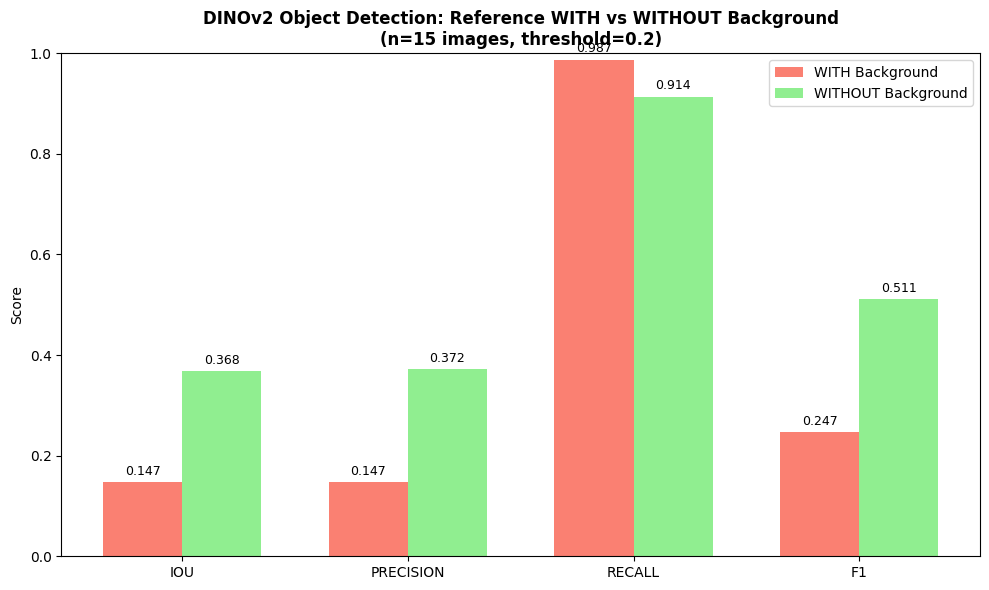

In [13]:
# Bar chart comparison
if results:
    metrics_names = ['iou', 'precision', 'recall', 'f1']
    
    avg_bg = [np.mean([r['metrics_bg'][m] for r in results]) for m in metrics_names]
    avg_nbg = [np.mean([r['metrics_nbg'][m] for r in results]) for m in metrics_names]
    
    x = np.arange(len(metrics_names))
    width = 0.35
    
    fig, ax = plt.subplots(figsize=(10, 6))
    bars1 = ax.bar(x - width/2, avg_bg, width, label='WITH Background', color='salmon')
    bars2 = ax.bar(x + width/2, avg_nbg, width, label='WITHOUT Background', color='lightgreen')
    
    ax.set_ylabel('Score')
    ax.set_title(f'DINOv2 Object Detection: Reference WITH vs WITHOUT Background\n(n={len(results)} images, threshold={THRESHOLD})', fontweight='bold')
    ax.set_xticks(x)
    ax.set_xticklabels([m.upper() for m in metrics_names])
    ax.legend()
    ax.set_ylim(0, 1)
    
    # Add value labels
    for bar in bars1:
        height = bar.get_height()
        ax.annotate(f'{height:.3f}', xy=(bar.get_x() + bar.get_width()/2, height),
                    xytext=(0, 3), textcoords="offset points", ha='center', va='bottom', fontsize=9)
    for bar in bars2:
        height = bar.get_height()
        ax.annotate(f'{height:.3f}', xy=(bar.get_x() + bar.get_width()/2, height),
                    xytext=(0, 3), textcoords="offset points", ha='center', va='bottom', fontsize=9)
    
    plt.tight_layout()
    plt.show()

## Conclusion

This benchmark compares DINOv2-based object detection using:
- **Reference WITH Background**: May include context clues but also noise
- **Reference WITHOUT Background**: Pure object features, no distractions

**Key Metrics:**
- **IoU**: Overlap between prediction and ground truth
- **Precision**: How much of the prediction is correct
- **Recall**: How much of the ground truth was found
- **F1**: Harmonic mean of precision and recall

In [14]:
# from huggingface_hub import hf_hub_download
# import os

# # First, get the image numbers that have car color #8E300D
# CAR_COLOR = (142, 48, 13)
# panoptic_files = sorted(glob('panoptic/panoptic_*.png'))

# car_image_nums = []
# for panoptic_path in panoptic_files:
#     panoptic = np.array(Image.open(panoptic_path))
#     if len(panoptic.shape) == 3:
#         r_match = (panoptic[:,:,0] == CAR_COLOR[0])
#         g_match = (panoptic[:,:,1] == CAR_COLOR[1])
#         b_match = (panoptic[:,:,2] == CAR_COLOR[2])
#         if (r_match & g_match & b_match).sum() > 0:
#             img_num = os.path.basename(panoptic_path).replace('panoptic_', '').replace('.png', '')
#             car_image_nums.append(img_num)

# print(f"Found {len(car_image_nums)} images with car color #8E300D")
# print(f"Image numbers: {car_image_nums[:20]}...")

# # Download only those RGB images
# os.makedirs('urbansyn_subset/rgb', exist_ok=True)

# for i, img_num in enumerate(car_image_nums):
#     try:
#         # Download from HuggingFace
#         hf_hub_download(
#             repo_id="UrbanSyn/UrbanSyn",
#             filename=f"rgb/rgb_{img_num}.png",
#             repo_type="dataset",
#             local_dir="./urbansyn_subset"
#         )
#         print(f"[{i+1}/{len(car_image_nums)}] Downloaded rgb_{img_num}.png")
#     except Exception as e:
#         print(f"[{i+1}/{len(car_image_nums)}] Failed rgb_{img_num}.png: {e}")

# print(f"\nDone! Downloaded {len(car_image_nums)} RGB images to urbansyn_subset/rgb/")
